# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
!python -m pip install "git+https://github.com/facebookresearch/detectron2.git"
#!git clone "https://github.com/facebookresearch/detectron2.git"
#!python -m pip install -e detectron2


In [2]:
#%cd detectron2
#%cd ..

In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


c:\Users\Tobias\anaconda3\envs\rcnn\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_Mar__8_18:36:24_Pacific_Standard_Time_2022
Cuda compilation tools, release 11.6, V11.6.124
Build cuda_11.6.r11.6/compiler.31057947_0
torch:  1.11 ; cuda:  1.11.0
detectron2: 0.6


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from matplotlib import pyplot as plt
from PIL import Image

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [3]:
import os 

cwd = os.getcwd()
print(cwd)

c:\Ablage\Master\DeepVision\Studienarbeit\YOLOv5-vs-RCNN


In [4]:
DATASET_DIR = "datasets/exDark_rcnn"
DATASET_NAME = "exDark"
TRAIN = True

# Run a pre-trained detectron2 model

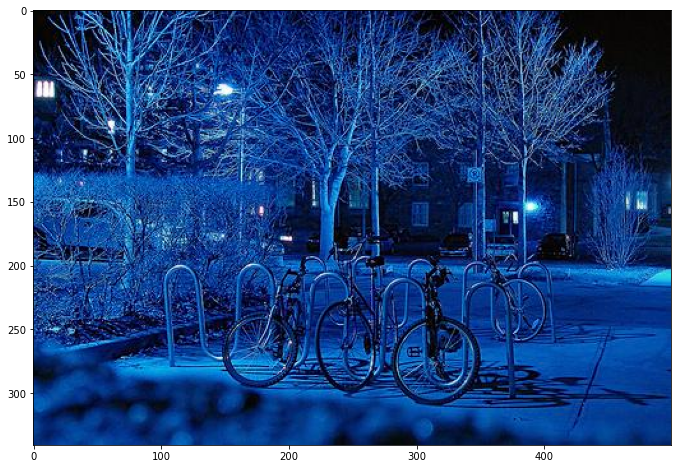

In [13]:
#show example image from the ExDark dataset
im = cv2.imread(f"{DATASET_DIR}/train/2015_00002_png.rf.b4d8e1b8291f34d5fb8babfe10c75dea.jpg")
plt.imshow(im)
plt.show()

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [17]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
#cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
#cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

In [18]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([1, 1, 1, 1, 2, 2, 2], device='cuda:0')
Boxes(tensor([[148.3874, 196.0025, 217.9480, 294.9059],
        [220.5483, 181.0676, 299.5615, 297.4632],
        [276.2433, 190.1363, 354.0401, 309.3339],
        [336.4940, 190.1914, 401.9835, 259.0024],
        [318.8123, 174.4183, 344.7225, 195.3329],
        [281.4407, 175.2573, 321.4133, 192.2438],
        [395.0358, 174.5068, 426.5875, 196.3330]], device='cuda:0'))


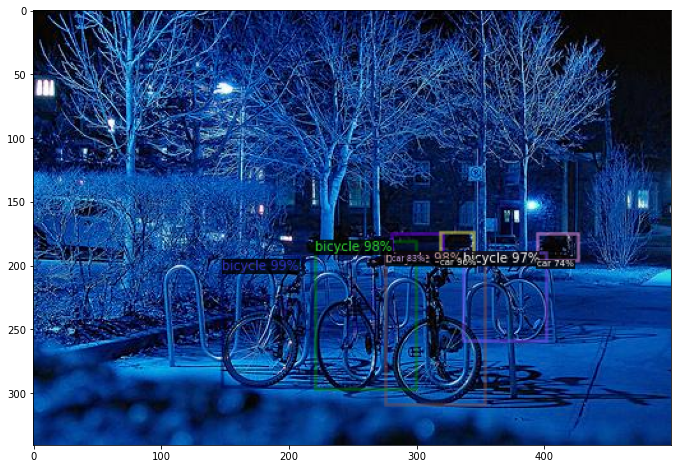

In [19]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(out.get_image()[:, :, ::-1])
plt.imshow(out.get_image()[:, :, ::-1])
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

# Train on a custom dataset


## Prepare the dataset

In [48]:
from detectron2.structures import BoxMode

from detectron2.data.datasets import register_coco_instances
register_coco_instances(f"{DATASET_NAME}_train3", {}, f"{DATASET_DIR}/train/_annotations_train.json", f"{DATASET_DIR}/train")
register_coco_instances(f"{DATASET_NAME}_valid3", {}, f"{DATASET_DIR}/valid/_annotations_valid.json", f"{DATASET_DIR}/valid")

In [49]:
from detectron2.data import get_detection_dataset_dicts
from detectron2.data.datasets import builtin_meta

In [50]:
dataset_dicts = get_detection_dataset_dicts([f"{DATASET_NAME}_train3"])

WARNING [06/06 04:27:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/06 04:27:13 d2.data.datasets.coco]: Loaded 5879 images in COCO format from datasets/exDark_rcnn/train/_annotations_train.json
[06/06 04:27:13 d2.data.build]: Removed 0 images with no usable annotations. 5879 images left.


In [51]:
_dataset_metadata = MetadataCatalog.get(f"{DATASET_NAME}_train3")
_dataset_metadata.thing_colors = [cc['color'] for cc in builtin_meta.COCO_CATEGORIES]

In [52]:
_dataset_metadata

namespace(name='exDark_train3',
          json_file='datasets/exDark_rcnn/train/_annotations_train.json',
          image_root='datasets/exDark_rcnn/train',
          evaluator_type='coco',
          thing_classes=['Objects',
                         'Bicycle',
                         'Boat',
                         'Bottle',
                         'Bus',
                         'Car',
                         'Cat',
                         'Chair',
                         'Cup',
                         'Dog',
                         'Motorbike',
                         'People',
                         'Table'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
           

In [53]:
NUM_CLASSES = len(_dataset_metadata.thing_classes)
print(f"{NUM_CLASSES}")

13


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



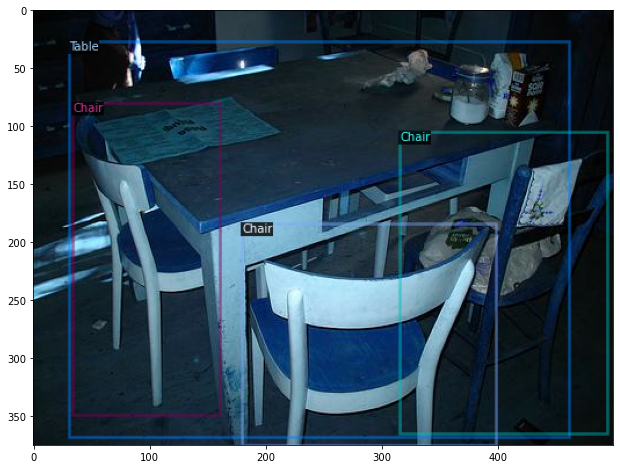

In [55]:
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1],metadata=_dataset_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

## Train


In [59]:
from detectron2.engine import DefaultTrainer

torch.cuda.empty_cache()

if TRAIN == True:
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
    cfg.DATASETS.TRAIN = (f"{DATASET_NAME}_train2",)
    cfg.DATASETS.TEST = ()
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml") 
    #cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
    cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
    cfg.SOLVER.BASE_LR = 0.00025 
    cfg.SOLVER.MAX_ITER = 2000   
    cfg.SOLVER.STEPS = []        # do not decay learning rate
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # (default: 512) half to save gpu memory
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES  

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg) 
    trainer.resume_or_load(resume=False)
    trainer.train()

[06/06 04:30:53 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (14, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (14,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (52, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (52,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[06/06 04:31:13 d2.engine.train_loop]: Starting training from iteration 0
[06/06 04:32:06 d2.utils.events]:  eta: 0:41:43  iter: 19  total_loss: 3.158  loss_cls: 2.576  loss_box_reg: 0.5327  loss_rpn_cls: 0.01362  loss_rpn_loc: 0.02267  time: 2.0918  data_time: 0.1085  lr: 4.9953e-06  max_mem: 10205M
[06/06 04:32:43 d2.utils.events]:  eta: 0:41:03  iter: 39  total_loss: 2.999  loss_cls: 2.465  loss_box_reg: 0.5153  loss_rpn_cls: 0.02169  loss_rpn_loc: 0.01702  time: 1.9647  data_time: 0.0115  lr: 9.9902e-06  max_mem: 10205M
[06/06 04:33:27 d2.utils.events]:  eta: 0:40:53  iter: 59  total_loss: 2.829  loss_cls: 2.27  loss_box_reg: 0.5696  loss_rpn_cls: 0.01733  loss_rpn_loc: 0.01701  time: 2.0383  data_time: 0.0310  lr: 1.4985e-05  max_mem: 10205M
[06/06 04:34:05 d2.utils.events]:  eta: 0:40:48  iter: 79  total_loss: 2.504  loss_cls: 1.887  loss_box_reg: 0.5345  loss_rpn_cls: 0.01568  loss_rpn_loc: 0.01785  time: 2.0013  data_time: 0.0112  lr: 1.998e-05  max_mem: 10205M
[06/06 04:34:49 

In [39]:
# Look at training curves in tensorboard:
%load_ext tensorboard

#%tensorboard --logdir ./output
#%tensorboard --logdir=rcnn:./output,yolov5:yolov5/runs/train
#%tensorboard dev upload --logdir ./output
#%tensorboard dev upload --logdir=rcnn:./output,yolov5:yolov5/runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC]
                   [--host ADDR] [--bind_all] [--port PORT]
                   [--reuse_port BOOL] [--load_fast {false,auto,true}]
                   [--extra_data_server_flags EXTRA_DATA_SERVER_FLAGS]
                   [--grpc_creds_type {local,ssl,ssl_dev}]
                   [--grpc_data_provider PORT] [--purge_orphaned_data BOOL]
                   [--db URI] [--db_import] [--inspect] [--version_tb]
                   [--tag TAG] [--event_file PATH] [--path_prefix PATH]
                   [--window_title TEXT] [--max_reload_threads COUNT]
                   [--reload_interval SECONDS] [--reload_task TYPE]
                   [--reload_multifile BOOL]
                   [--reload_multifile_inactive_secs SECONDS]
                   [--generic_data TYPE]
                   [--samples_per_plugin SAMPLES_PER_PLUGIN]
                   [-

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [30]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "exDark_Model.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   #(default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES  
predictor = DefaultPredictor(cfg)

[06/06 02:03:52 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                         | Shapes                                          |
|:------------------------------------------------|:--------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weig

In [32]:
dataset_dicts_val = get_detection_dataset_dicts([f"{DATASET_NAME}_valid2"])
#dataset_dicts_val = dataset_dicts

WARNING [06/06 02:04:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/06 02:04:22 d2.data.datasets.coco]: Loaded 731 images in COCO format from datasets/exDark_rcnn/valid/_annotations_valid.json
[06/06 02:04:22 d2.data.build]: Removed 0 images with no usable annotations. 731 images left.
[06/06 02:04:22 d2.data.build]: Distribution of instances among all 13 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  Objects   | 0            |  Bicycle   | 104          |    Boat    | 135          |
|   Bottle   | 175          |    Bus     | 81           |    Car     | 258          |
|    Cat     | 94           |   Chair    | 235          |    Cup     | 133          |
|    Dog     | 112          | Motorbike  | 130          |   People   | 771          |
|   Table    | 136          |           

Then, we randomly select several samples to visualize the prediction results.

datasets/exDark_rcnn/valid\2015_05706_png.rf.ce56d8c2d84bb4423636fe2f59d6aa95.jpg


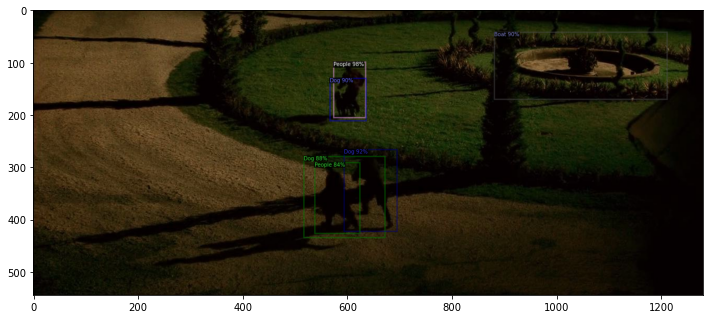

datasets/exDark_rcnn/valid\2015_04186_JPG.rf.3f5214caa74f70f64ecd5fb6cf1e6980.jpg


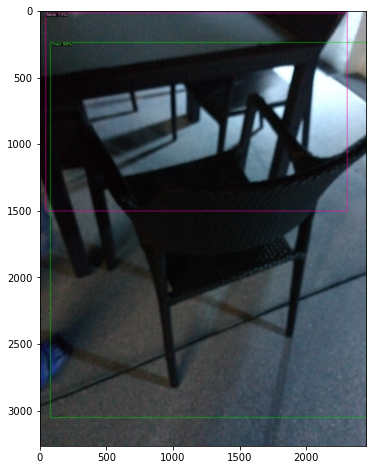

datasets/exDark_rcnn/valid\2015_00509_jpg.rf.8d5f8b9aeec30dd843bf6c66374195cb.jpg


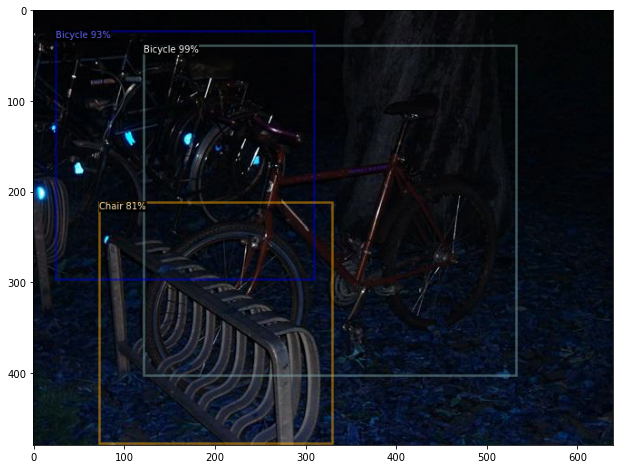

In [34]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts_val = dataset_dicts_val

for d in random.sample(dataset_dicts_val, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=_dataset_metadata, 
                   scale=1, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(d["file_name"])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

We can also evaluate its performance using AP metric implemented in COCO API

In [35]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator(f"{DATASET_NAME}_valid2", output_dir="./output")
val_loader = build_detection_test_loader(cfg, f"{DATASET_NAME}_valid2")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [06/06 02:06:38 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/06 02:06:38 d2.data.datasets.coco]: Loaded 731 images in COCO format from datasets/exDark_rcnn/valid/_annotations_valid.json
[06/06 02:06:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/06 02:06:39 d2.data.common]: Serializing 731 elements to byte tensors and concatenating them all ...
[06/06 02:06:39 d2.data.common]: Serialized dataset takes 0.24 MiB
[06/06 02:06:39 d2.evaluation.evaluator]: Start inference on 731 batches
[06/06 02:07:05 d2.evaluation.evaluator]: Inference done 1/731. Dataloading: 1.9571 s/iter. Inference: 24.7966 s/iter. Eval: 0.0006 s/iter. Total: 26.7547 s/iter. ETA=5:25:30
[06/06 02:07:25 d2.evaluation.evaluator]: Inference done 3/731. Dataloading: 0.6527 s/iter. Inference: 14.9798 s/iter. Eval: 0.0003 s/

In [ ]:
# OrderedDict([('bbox', {'AP': 35.31437301605867, 'AP50': 60.69835410825127, 'AP75': 38.14298774333823, 'APs': 6.590435534172514, 
# 'APm': 23.99620607706872, 'APl': 42.048406303110866, 'AP-Objects': nan, 'AP-Bicycle': 47.47969420280049, 'AP-Boat': 33.923222294445985, 
# 'AP-Bottle': 31.742602177847456, 'AP-Bus': 54.92431593719117, 'AP-Car': 44.499255042355635, 'AP-Cat': 23.66642637570071, 
# 'AP-Chair': 24.983492831016143, 'AP-Cup': 35.780358590755824, 'AP-Dog': 46.56205885040766, 'AP-Motorbike': 25.511725986976025, 
# 'AP-People': 36.99901120471325, 'AP-Table': 17.70031269849373})])

# Run segmentation on a video